In [1]:
!pip install tensorflow numpy matplotlib scikit-learn opencv-python


In [3]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, ReLU, concatenate
from tensorflow.keras.applications import ResNet50
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Paths
DATASET_PATH = r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma"
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# === 1. Data Preparation with Augmentation ===
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    zoom_range=0.2,
    rotation_range=20,
    horizontal_flip=True,
    shear_range=0.2
)

train_generator = datagen.flow_from_directory(
    DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = datagen.flow_from_directory(
    DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# === 2. Custom CNN Feature Extractor ===
def custom_cnn_block(input_tensor):
    x = Conv2D(32, (3,3), padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = MaxPooling2D()(x)

    x = Conv2D(64, (3,3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = MaxPooling2D()(x)

    x = Conv2D(128, (3,3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = MaxPooling2D()(x)

    x = Flatten()(x)
    return x

# === 3. Pretrained ResNet50 (frozen) ===
def pretrained_model_block(input_tensor):
    base_model = ResNet50(include_top=False, weights='imagenet', input_tensor=input_tensor, pooling='avg')
    base_model.trainable = False  # Freeze layers
    return base_model.output

# === 4. Merging Both Models ===
input_layer = Input(shape=IMG_SIZE + (3,))
custom_features = custom_cnn_block(input_layer)
pretrained_features = pretrained_model_block(input_layer)

merged = concatenate([custom_features, pretrained_features])

x = Dense(512, activation='relu')(merged)
x = Dropout(0.4)(x)
x = Dense(128, activation='relu')(x)
output_layer = Dense(3, activation='softmax')(x)  # 3 classes

model = Model(inputs=input_layer, outputs=output_layer)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

# === 5. Training ===
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=25,
    verbose=1
)

# === 6. Evaluation ===
# Predict and get labels
val_generator.reset()
Y_pred = model.predict(val_generator)
y_pred = np.argmax(Y_pred, axis=1)
y_true = val_generator.classes

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=val_generator.class_indices.keys()))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=val_generator.class_indices, yticklabels=val_generator.class_indices)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Save model
model.save("lymphoma_hybrid_model.h5")


Found 12000 images belonging to 3 classes.
Found 3000 images belonging to 3 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 30s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 76,177,219 (290.59 MB)

 Trainable params: 52,589,059 (200.61 MB)

 Non-trainable params: 23,588,160 (89.98 MB)

C:\Users\dell\anaconda3\New folder\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
  6/375 ━━━━━━━━━━━━━━━━━━━━ 37:49 6s/step - accuracy: 0.3163 - loss: 132.2465

KeyboardInterrupt: 

In [5]:
import os
import cv2
import numpy as np
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from tqdm import tqdm

# === PATHS ===
BASE_DIR = r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma"
CLASSES = ['lymph_mcl', 'lymph_cll', 'lymph_fl']
IMG_SIZE = 256

def extract_features(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    
    # --- Preprocessing ---
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_eq = cv2.equalizeHist(gray)
    blur = cv2.GaussianBlur(gray_eq, (3, 3), 0)

    # --- Color Features ---
    means = np.mean(img, axis=(0, 1))
    stds = np.std(img, axis=(0, 1))

    # --- Texture (GLCM) ---
    glcm = graycomatrix(blur, [5], [0], 256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    energy = graycoprops(glcm, 'energy')[0, 0]
    correlation = graycoprops(glcm, 'correlation')[0, 0]

    # --- Edge Density ---
    edges = cv2.Canny(blur, 100, 200)
    edge_density = np.sum(edges) / (IMG_SIZE * IMG_SIZE)

    # --- Intensity Histogram (compressed to 10 bins) ---
    hist = cv2.calcHist([gray], [0], None, [10], [0, 256]).flatten()
    hist = hist / np.sum(hist)

    # --- Combine All Features ---
    features = np.concatenate([
        means, stds,
        [contrast, homogeneity, energy, correlation, edge_density],
        hist
    ])

    return features

# === 1. Build Dataset ===
X = []
y = []

print("Extracting features...")
for label, class_name in enumerate(CLASSES):
    folder = os.path.join(BASE_DIR, class_name)
    for img_file in tqdm(os.listdir(folder)):
        if img_file.lower().endswith(".jpg"):
            img_path = os.path.join(folder, img_file)
            try:
                features = extract_features(img_path)
                X.append(features)
                y.append(label)
            except Exception as e:
                print(f"Error processing {img_file}: {e}")

X = np.array(X)
y = np.array(y)

# === 2. Train ML Model ===
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(n_estimators=200, random_state=42)
model.fit(X_train, y_train)

# === 3. Evaluate ===
y_pred = model.predict(X_test)
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred, target_names=CLASSES))


Extracting features...


100%|██████████| 5000/5000 [01:52<00:00, 44.62it/s]



Classification Report:

              precision    recall  f1-score   support

   lymph_mcl       1.00      1.00      1.00      1037
   lymph_cll       0.99      1.00      1.00       970
    lymph_fl       1.00      0.99      1.00       993

    accuracy                           1.00      3000
   macro avg       1.00      1.00      1.00      3000
weighted avg       1.00      1.00      1.00      3000



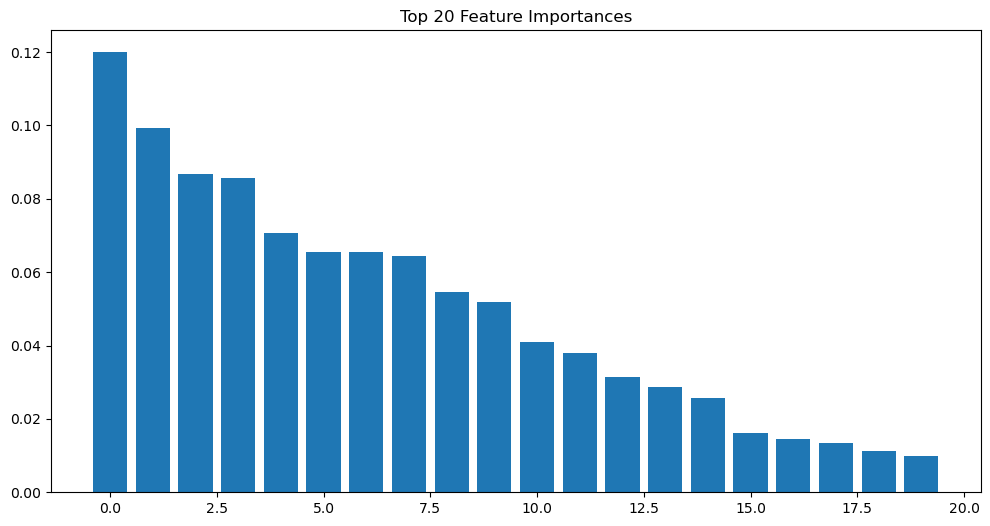

In [7]:
import matplotlib.pyplot as plt

importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12,6))
plt.title("Top 20 Feature Importances")
plt.bar(range(20), importances[indices[:20]])
plt.show()


Mean RGB: [125.32055283 118.93385315 134.4041748 ]
Std RGB: [32.28549149 33.21463742 29.82367571]


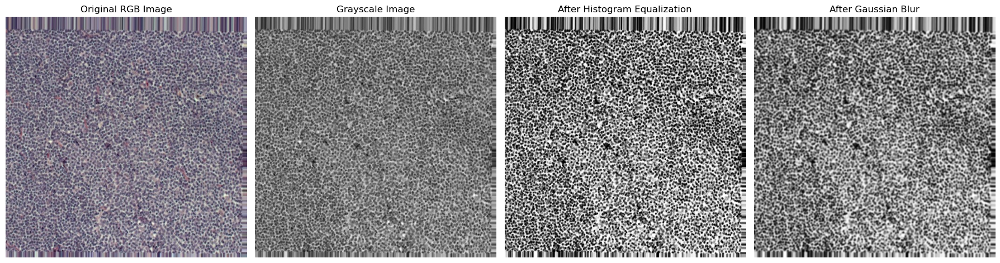

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# === Load Image ===
image_path = r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_mcl\lymph_mcl_4945.jpg"
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# === 1. Mean & Std of RGB Channels ===
mean_rgb = np.mean(img_rgb, axis=(0, 1))
std_rgb = np.std(img_rgb, axis=(0, 1))

print(f"Mean RGB: {mean_rgb}")
print(f"Std RGB: {std_rgb}")

# === 2. Histogram Equalization ===
img_eq = cv2.equalizeHist(img_gray)

# === 3. Gaussian Blur ===
img_blur = cv2.GaussianBlur(img_eq, (5, 5), 0)

# === Visualization ===
fig, axs = plt.subplots(1, 4, figsize=(18, 5))

axs[0].imshow(img_rgb)
axs[0].set_title("Original RGB Image")
axs[0].axis("off")

axs[1].imshow(img_gray, cmap='gray')
axs[1].set_title("Grayscale Image")
axs[1].axis("off")

axs[2].imshow(img_eq, cmap='gray')
axs[2].set_title("After Histogram Equalization")
axs[2].axis("off")

axs[3].imshow(img_blur, cmap='gray')
axs[3].set_title("After Gaussian Blur")
axs[3].axis("off")

plt.tight_layout()
plt.show()


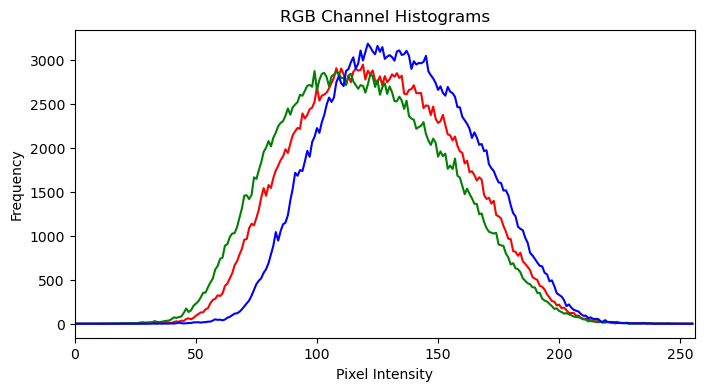

In [11]:
colors = ('r','g','b')
plt.figure(figsize=(8,4))
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb], [i], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.xlim([0,256])
plt.title("RGB Channel Histograms")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()


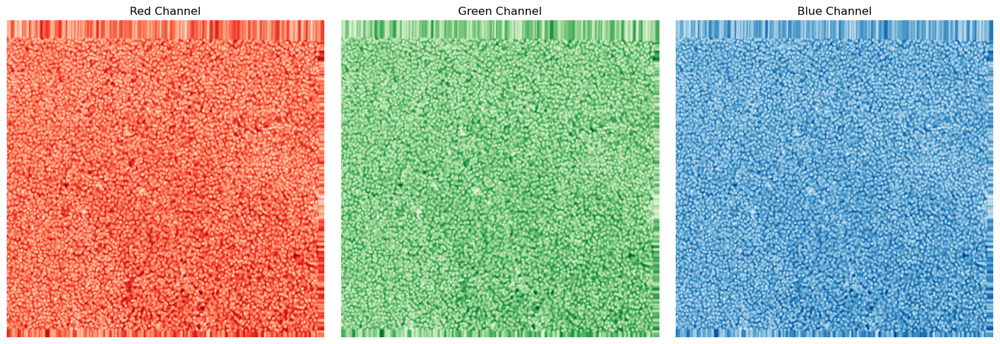

In [13]:
r, g, b = cv2.split(img_rgb)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(r, cmap='Reds'); axs[0].set_title("Red Channel"); axs[0].axis('off')
axs[1].imshow(g, cmap='Greens'); axs[1].set_title("Green Channel"); axs[1].axis('off')
axs[2].imshow(b, cmap='Blues'); axs[2].set_title("Blue Channel"); axs[2].axis('off')
plt.tight_layout(); plt.show()


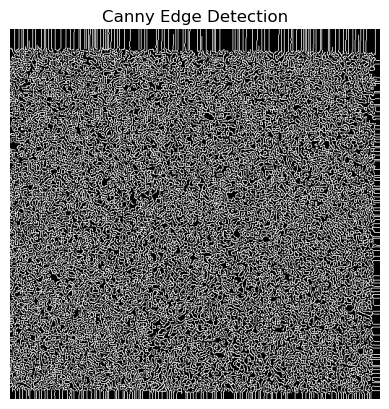

In [15]:
edges = cv2.Canny(img_gray, 100, 200)
plt.imshow(edges, cmap='gray')
plt.title("Canny Edge Detection")
plt.axis("off")
plt.show()


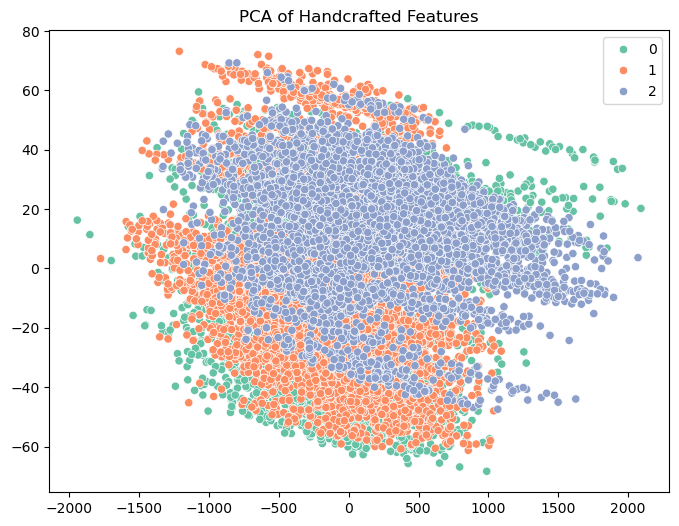

In [17]:
from sklearn.decomposition import PCA
import seaborn as sns

# Assuming X = features, y = class labels
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=y, palette="Set2")
plt.title("PCA of Handcrafted Features")
plt.show()


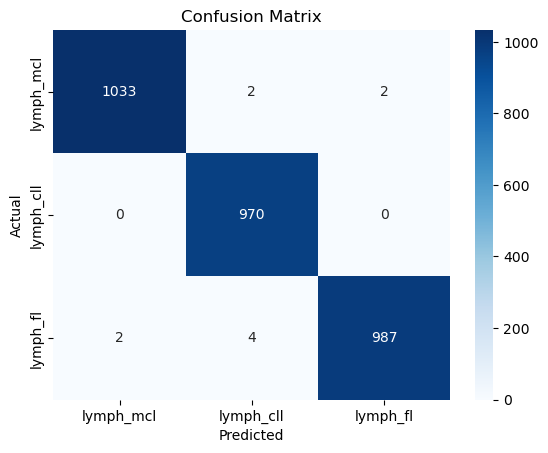

In [19]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=CLASSES, yticklabels=CLASSES, cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("Actual")
plt.show()


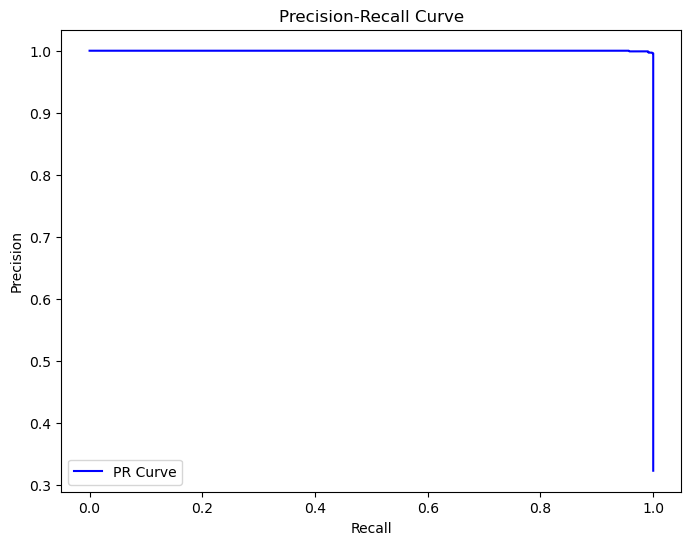

In [23]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc

# Compute Precision-Recall curve
precision, recall, thresholds = precision_recall_curve(y_test, model.predict_proba(X_test)[:, 1], pos_label=1)

# Plot Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', label='PR Curve')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend(loc="best")
plt.show()


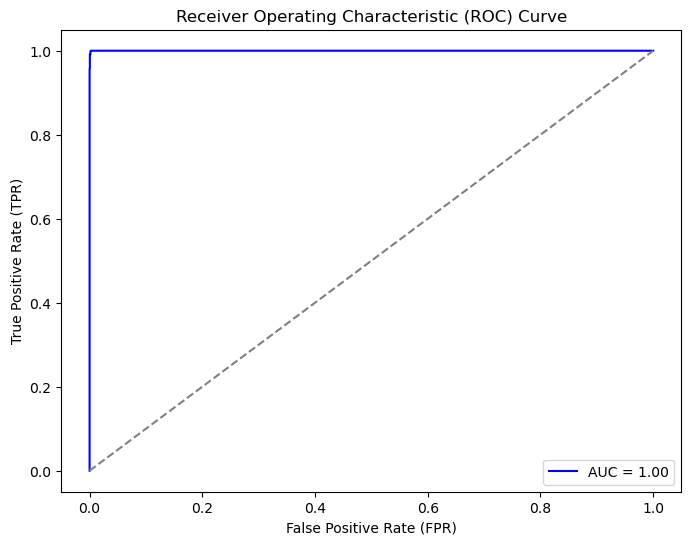

In [25]:
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Compute ROC curve
fpr, tpr, _ = roc_curve(y_test, model.predict_proba(X_test)[:, 1], pos_label=1)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f"AUC = {auc(fpr, tpr):.2f}")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="best")
plt.show()


In [37]:
import cv2
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import os
import joblib  # To save the model

# Define function to extract features from an image
def extract_features(image):
    """
    Extract features from a single image.
    Features include mean, std, contrast, homogeneity, and edge density.
    """
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize and preprocess
    img_resized = cv2.resize(img_rgb, (256, 256))
    gray_eq = cv2.equalizeHist(img_gray)
    blur = cv2.GaussianBlur(gray_eq, (3, 3), 0)
    
    # Feature Extraction
    means = np.mean(img_resized, axis=(0, 1))  # Mean of RGB channels
    stds = np.std(img_resized, axis=(0, 1))    # Standard deviation of RGB channels
    contrast = np.var(gray_eq)  # Variance as a measure of contrast
    homogeneity = np.sum(np.abs(gray_eq - np.mean(gray_eq)))  # Measure of homogeneity
    edges = cv2.Canny(blur, 100, 200)
    edge_density = np.sum(edges) / (256 * 256)  # Edge density
    
    # Combine features
    features = np.concatenate([means, stds, [contrast, homogeneity, edge_density]])
    return features

# Load your dataset (folders containing images)
data_dir = r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma"
categories = ["lymph_mcl", "lymph_cll", "lymph_fl"]

# Prepare dataset and labels
images = []
labels = []

for category in categories:
    folder_path = os.path.join(data_dir, category)
    for image_name in os.listdir(folder_path):
        image_path = os.path.join(folder_path, image_name)
        img = cv2.imread(image_path)
        if img is not None:
            features = extract_features(img)
            images.append(features)
            labels.append(category)

# Encode labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# Convert images and labels to numpy arrays
X = np.array(images)
y = np.array(labels_encoded)

# Split dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train Random Forest Classifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Evaluate the model
accuracy = model.score(X_test, y_test)
print(f"Model accuracy: {accuracy * 100:.2f}%")

# Save the trained model for later use
joblib.dump(model, 'lymphoma_classifier.pkl')
joblib.dump(label_encoder, 'label_encoder.pkl')


Model accuracy: 99.60%


['label_encoder.pkl']

In [38]:
import cv2
import numpy as np
import joblib

# Load the trained model and label encoder
model = joblib.load('lymphoma_classifier.pkl')
label_encoder = joblib.load('label_encoder.pkl')

# Define function to extract features from an image (same as during training)
def extract_features(image):
    """
    Extract features from a single image.
    Features include mean, std, contrast, homogeneity, and edge density.
    """
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize and preprocess
    img_resized = cv2.resize(img_rgb, (256, 256))
    gray_eq = cv2.equalizeHist(img_gray)
    blur = cv2.GaussianBlur(gray_eq, (3, 3), 0)
    
    # Feature Extraction
    means = np.mean(img_resized, axis=(0, 1))  # Mean of RGB channels
    stds = np.std(img_resized, axis=(0, 1))    # Standard deviation of RGB channels
    contrast = np.var(gray_eq)  # Variance as a measure of contrast
    homogeneity = np.sum(np.abs(gray_eq - np.mean(gray_eq)))  # Measure of homogeneity
    edges = cv2.Canny(blur, 100, 200)
    edge_density = np.sum(edges) / (256 * 256)  # Edge density
    
    # Combine features
    features = np.concatenate([means, stds, [contrast, homogeneity, edge_density]])
    return features

# Define function to classify a single image
def classify_image(image_path):
    """
    Classifies a single image into one of the lymphoma subtypes.
    """
    # Load the image
    img = cv2.imread(image_path)

    # Check if the image was loaded successfully
    if img is None:
        print("Error: Image not found or unable to load.")
        return None
    
    # Extract features from the image
    features = extract_features(img)
    
    # Reshape the feature vector for prediction
    features = features.reshape(1, -1)
    
    # Make the prediction
    prediction = model.predict(features)
    
    # Decode the label
    predicted_class = label_encoder.inverse_transform(prediction)
    
    return predicted_class[0]

# Test the function with a sample image
image_path = r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_mcl\lymph_mcl_4945.jpg"
predicted_class = classify_image(image_path)

if predicted_class:
    print(f"The predicted class for the image is: {predicted_class}")


The predicted class for the image is: lymph_mcl


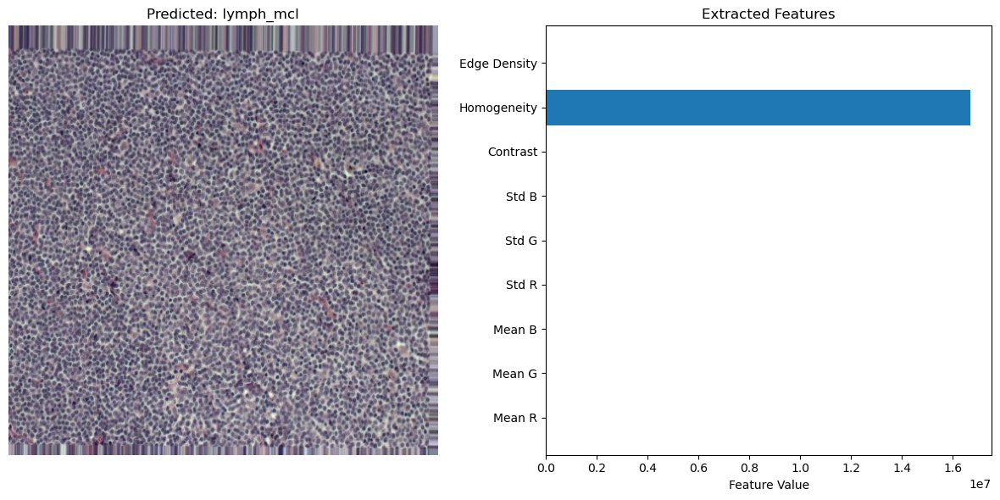

In [43]:
import cv2
import numpy as np
import joblib
import matplotlib.pyplot as plt

# Load the trained model and label encoder
model = joblib.load('lymphoma_classifier.pkl')
label_encoder = joblib.load('label_encoder.pkl')

# Define function to extract features from an image (same as during training)
def extract_features(image):
    """
    Extract features from a single image.
    Features include mean, std, contrast, homogeneity, and edge density.
    """
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize and preprocess
    img_resized = cv2.resize(img_rgb, (256, 256))
    gray_eq = cv2.equalizeHist(img_gray)
    blur = cv2.GaussianBlur(gray_eq, (3, 3), 0)
    
    # Feature Extraction
    means = np.mean(img_resized, axis=(0, 1))  # Mean of RGB channels
    stds = np.std(img_resized, axis=(0, 1))    # Standard deviation of RGB channels
    contrast = np.var(gray_eq)  # Variance as a measure of contrast
    homogeneity = np.sum(np.abs(gray_eq - np.mean(gray_eq)))  # Measure of homogeneity
    edges = cv2.Canny(blur, 100, 200)
    edge_density = np.sum(edges) / (256 * 256)  # Edge density
    
    # Combine features
    features = np.concatenate([means, stds, [contrast, homogeneity, edge_density]])
    return features

# Define function to classify a single image
def classify_image(image_path):
    """
    Classifies a single image into one of the lymphoma subtypes.
    """
    # Load the image
    img = cv2.imread(image_path)

    # Check if the image was loaded successfully
    if img is None:
        print("Error: Image not found or unable to load.")
        return None
    
    # Extract features from the image
    features = extract_features(img)
    
    # Reshape the feature vector for prediction
    features = features.reshape(1, -1)
    
    # Make the prediction
    prediction = model.predict(features)
    
    # Decode the label
    predicted_class = label_encoder.inverse_transform(prediction)
    
    return img, predicted_class[0], features

# Test the function with a sample image
image_path = r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_mcl\lymph_mcl_4945.jpg"
img, predicted_class, features = classify_image(image_path)

# Visualize the image, predicted class, and feature values
if img is not None:
    # Create subplots for visualization
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot the image
    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[0].axis('off')
    ax[0].set_title(f"Predicted: {predicted_class}")
    
    # Plot the extracted features
    feature_names = ["Mean R", "Mean G", "Mean B", "Std R", "Std G", "Std B", "Contrast", "Homogeneity", "Edge Density"]
    
    # Ensure features are in a 1D array format for plotting
    features = features.flatten()  # Flatten the features array if needed
    
    # Plot the features as a horizontal bar chart
    ax[1].barh(feature_names, features)
    ax[1].set_title("Extracted Features")
    ax[1].set_xlabel("Feature Value")
    
    plt.tight_layout()
    plt.show()
else:
    print("Unable to classify the image.")


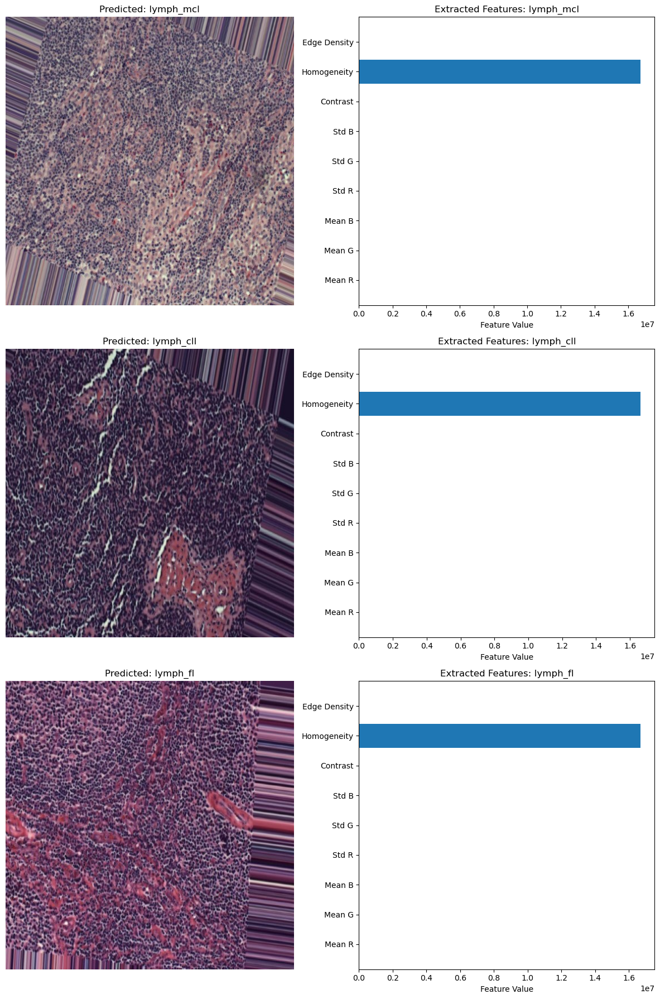

In [45]:
import cv2
import numpy as np
import joblib
import matplotlib.pyplot as plt

# Load the trained model and label encoder
model = joblib.load('lymphoma_classifier.pkl')
label_encoder = joblib.load('label_encoder.pkl')

# Define function to extract features from an image
def extract_features(image):
    """
    Extract features from a single image.
    Features include mean, std, contrast, homogeneity, and edge density.
    """
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize and preprocess
    img_resized = cv2.resize(img_rgb, (256, 256))
    gray_eq = cv2.equalizeHist(img_gray)
    blur = cv2.GaussianBlur(gray_eq, (3, 3), 0)
    
    # Feature Extraction
    means = np.mean(img_resized, axis=(0, 1))  # Mean of RGB channels
    stds = np.std(img_resized, axis=(0, 1))    # Standard deviation of RGB channels
    contrast = np.var(gray_eq)  # Variance as a measure of contrast
    homogeneity = np.sum(np.abs(gray_eq - np.mean(gray_eq)))  # Measure of homogeneity
    edges = cv2.Canny(blur, 100, 200)
    edge_density = np.sum(edges) / (256 * 256)  # Edge density
    
    # Combine features
    features = np.concatenate([means, stds, [contrast, homogeneity, edge_density]])
    return features

# Define function to classify a single image
def classify_image(image_path):
    """
    Classifies a single image into one of the lymphoma subtypes.
    """
    # Load the image
    img = cv2.imread(image_path)

    # Check if the image was loaded successfully
    if img is None:
        print("Error: Image not found or unable to load.")
        return None
    
    # Extract features from the image
    features = extract_features(img)
    
    # Reshape the feature vector for prediction
    features = features.reshape(1, -1)
    
    # Make the prediction
    prediction = model.predict(features)
    
    # Decode the label
    predicted_class = label_encoder.inverse_transform(prediction)
    
    return img, predicted_class[0], features

# List of images to process
image_paths = [
    r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_mcl\lymph_mcl_4949.jpg",
    r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_cll\lymph_cll_4958.jpg",
    r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_fl\lymph_fl_4905.jpg"
]

# Create subplots for visualization
fig, axes = plt.subplots(len(image_paths), 2, figsize=(12, len(image_paths) * 6))

# Process each image and plot the results
for idx, image_path in enumerate(image_paths):
    img, predicted_class, features = classify_image(image_path)
    
    if img is not None:
        # Plot the image
        axes[idx, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[idx, 0].axis('off')
        axes[idx, 0].set_title(f"Predicted: {predicted_class}")
        
        # Plot the extracted features
        feature_names = ["Mean R", "Mean G", "Mean B", "Std R", "Std G", "Std B", "Contrast", "Homogeneity", "Edge Density"]
        
        # Ensure features are in a 1D array format for plotting
        features = features.flatten()  # Flatten the features array if needed
        
        # Plot the features as a horizontal bar chart
        axes[idx, 1].barh(feature_names, features)
        axes[idx, 1].set_title(f"Extracted Features: {predicted_class}")
        axes[idx, 1].set_xlabel("Feature Value")
    else:
        print(f"Unable to classify the image: {image_path}")

# Adjust layout for the plots
plt.tight_layout()
plt.show()


C:\Users\dell\anaconda3\New folder\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


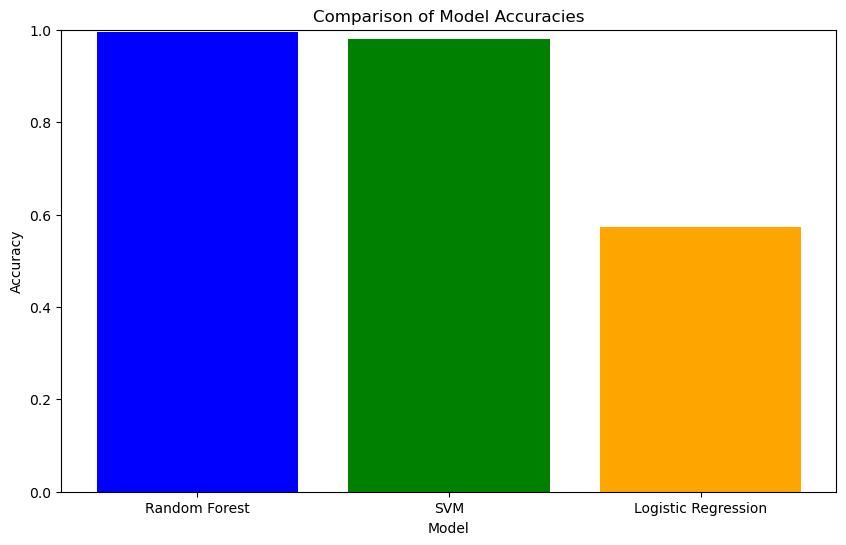

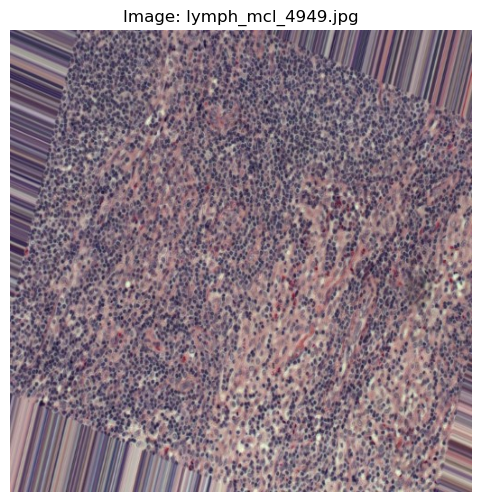

Predictions for lymph_mcl_4949.jpg:
Random Forest: lymph_mcl
SVM: lymph_mcl
Logistic Regression: lymph_mcl
----------------------------------------


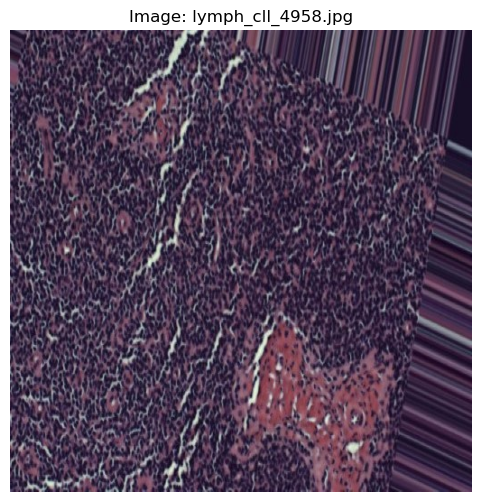

Predictions for lymph_cll_4958.jpg:
Random Forest: lymph_cll
SVM: lymph_cll
Logistic Regression: lymph_fl
----------------------------------------


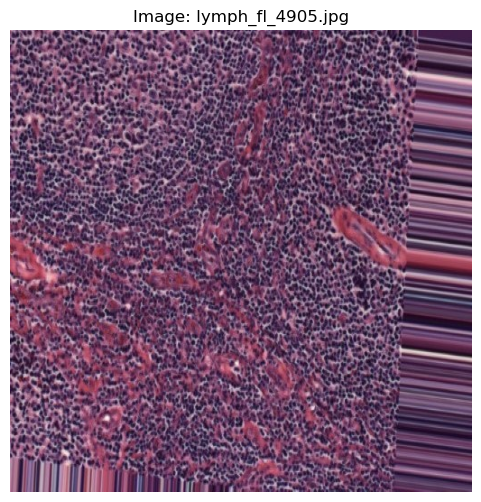

Predictions for lymph_fl_4905.jpg:
Random Forest: lymph_fl
SVM: lymph_fl
Logistic Regression: lymph_fl
----------------------------------------


In [49]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import joblib

# Define function to extract features from an image
def extract_features(image):
    """
    Extract features from a single image:
    Features include mean, std, contrast, homogeneity, and edge density.
    """
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize and preprocess
    img_resized = cv2.resize(img_rgb, (256, 256))
    gray_eq = cv2.equalizeHist(img_gray)
    blur = cv2.GaussianBlur(gray_eq, (3, 3), 0)
    
    # Feature Extraction
    means = np.mean(img_resized, axis=(0, 1))  # Mean of RGB channels
    stds = np.std(img_resized, axis=(0, 1))    # Standard deviation of RGB channels
    contrast = np.var(gray_eq)  # Variance as a measure of contrast
    homogeneity = np.sum(np.abs(gray_eq - np.mean(gray_eq)))  # Measure of homogeneity
    edges = cv2.Canny(blur, 100, 200)
    edge_density = np.sum(edges) / (256 * 256)  # Edge density
    
    # Combine features into a vector
    features = np.concatenate([means, stds, [contrast, homogeneity, edge_density]])
    return features

# Load entire lymphoma dataset
dataset_path = r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma"
categories = ['lymph_mcl', 'lymph_cll', 'lymph_fl']

# Initialize arrays to store features and labels
features = []
labels = []

# Loop over the categories and load images
for category in categories:
    category_path = os.path.join(dataset_path, category)
    for image_name in os.listdir(category_path):
        image_path = os.path.join(category_path, image_name)
        img = cv2.imread(image_path)
        if img is not None:
            feature = extract_features(img)
            features.append(feature)
            labels.append(category)

# Convert lists to numpy arrays
features = np.array(features)
labels = np.array(labels)

# Encode the labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels_encoded, test_size=0.2, random_state=42)

# Create machine learning models
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
svm_model = make_pipeline(StandardScaler(), SVC(random_state=42))
lr_model = LogisticRegression(random_state=42)

# Train models
rf_model.fit(X_train, y_train)
svm_model.fit(X_train, y_train)
lr_model.fit(X_train, y_train)

# Evaluate models
rf_pred = rf_model.predict(X_test)
svm_pred = svm_model.predict(X_test)
lr_pred = lr_model.predict(X_test)

rf_accuracy = accuracy_score(y_test, rf_pred)
svm_accuracy = accuracy_score(y_test, svm_pred)
lr_accuracy = accuracy_score(y_test, lr_pred)

# Create a bar plot to compare accuracies
accuracies = [rf_accuracy, svm_accuracy, lr_accuracy]
models = ['Random Forest', 'SVM', 'Logistic Regression']

plt.figure(figsize=(10, 6))
plt.bar(models, accuracies, color=['blue', 'green', 'orange'])
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies')
plt.ylim([0, 1])
plt.show()

# Save the models and label encoder for future use
joblib.dump(rf_model, 'rf_model.pkl')
joblib.dump(svm_model, 'svm_model.pkl')
joblib.dump(lr_model, 'lr_model.pkl')
joblib.dump(label_encoder, 'label_encoder.pkl')

# Visualizing three specific images and their predictions
def visualize_and_predict(images_paths):
    for path in images_paths:
        img = cv2.imread(path)
        if img is not None:
            # Show the image
            plt.figure(figsize=(6,6))
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title(f"Image: {os.path.basename(path)}")
            plt.axis('off')
            plt.show()

            # Extract features
            features = extract_features(img)
            features = features.reshape(1, -1)  # Reshape for prediction

            # Predict using the models
            rf_pred = rf_model.predict(features)
            svm_pred = svm_model.predict(features)
            lr_pred = lr_model.predict(features)

            # Decode the labels
            rf_class = label_encoder.inverse_transform(rf_pred)
            svm_class = label_encoder.inverse_transform(svm_pred)
            lr_class = label_encoder.inverse_transform(lr_pred)

            print(f"Predictions for {os.path.basename(path)}:")
            print(f"Random Forest: {rf_class[0]}")
            print(f"SVM: {svm_class[0]}")
            print(f"Logistic Regression: {lr_class[0]}")
            print("-" * 40)

# Paths for the three specific images
image_paths = [
    r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_mcl\lymph_mcl_4949.jpg",
    r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_cll\lymph_cll_4958.jpg",
    r"C:\Users\dell\Desktop\all files\RESEARCH WORK\Lymphoma\lymph_fl\lymph_fl_4905.jpg"
]

# Visualize the three images and their predictions
visualize_and_predict(image_paths)
